#Abstract:
The purpose of this notebooks is to perform deep learning using keras and tensorflow on cat and dog dataset. This notebook will try answer below questions:-
PART A - DEEP LEARNING MODEL (Creating a deep learning model)
Notebook will also try to answer, How does it affect accuracy? How does it affect how quickly the network plateaus? if we change below hyper parameters
PART B - ACTIVATION FUNCTION
PART C - COST FUNCTION
PART D - EPOCHS
PART E - GRADIENT ESTIMATION
PART F - NETWORK ARCHITECTURE
PART G - NETWORK INITIALIZATION
We will use keras and tensorboard to anwer above questions. After running all the  changes we found that there are minor chages if we change parameters from B-G except D which contributed to a better accuracy as compared to another. These results can be viewed clearly on Tensorboard.

#Actual work

1. Import the libraries

In [ ]:
#!pip install keras
#!pip install tensorflow
#!pip install torch torchvision

In [ ]:
import numpy as np
import pandas as pd
import keras
from keras.preprocessing.image import ImageDataGenerator,load_img
from keras.utils.np_utils import to_categorical
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import random
import os
import tensorflow as tf
import datetime

2. Define image properties

In [ ]:
Image_Width=128
Image_Height=128
Image_Size=(Image_Width,Image_Height)
Image_Channels=3

3. Prepare dataset for training model

In [ ]:
filenames=os.listdir("train1")
len(filenames)

categories=[]
for f_name in filenames:
    category=f_name.split('.')[0]
    if category=='dog':
        categories.append(1)
    else:
        categories.append(0)

df=pd.DataFrame({
    'filename':filenames,
    'category':categories
})

4. Define callbacks and learning rate

In [ ]:
from keras.callbacks import EarlyStopping, ReduceLROnPlateau, TensorBoard
#Early stopping is a method that allows you to specify an arbitrary large number of training epochs
#and stop training once the model performance stops improving on a hold out validation dataset
earlystop = EarlyStopping(patience = 10)
#Reduce learning rate when a metric has stopped improving.
#Models often benefit from reducing the learning rate by a factor of 2-10 once learning stagnates.
learning_rate_reduction = ReduceLROnPlateau(monitor = 'val_acc',patience = 2,verbose = 1,factor = 0.5,min_lr = 0.00001)
#Created the logs for tensorboard
log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = TensorBoard(log_dir=log_dir, histogram_freq=1)
#Defining the callbacks for training
callbacks = [earlystop,learning_rate_reduction,tensorboard_callback]

5. Manage data

In [ ]:
#Setting the size for train and and validate sets
df["category"] = df["category"].replace({0:'cat',1:'dog'})
train_df,validate_df = train_test_split(df,test_size=0.20,
  random_state=42)

train_df = train_df.reset_index(drop=True)
validate_df = validate_df.reset_index(drop=True)

total_train=train_df.shape[0]
total_validate=validate_df.shape[0]
batch_size=150

6. Training and validation data generator

In [ ]:
#Generating training data
train_datagen = ImageDataGenerator(rotation_range=15,
                                rescale=1./255,
                                shear_range=0.1,
                                zoom_range=0.2,
                                horizontal_flip=True,
                                width_shift_range=0.1,
                                height_shift_range=0.1
                                )

train_generator = train_datagen.flow_from_dataframe(train_df,
                                                 "train1/",x_col='filename',y_col='category',
                                                 target_size=Image_Size,
                                                 class_mode='categorical',
                                                 batch_size=batch_size)

#Genearating validation dataset
validation_datagen = ImageDataGenerator(rescale=1./255)
validation_generator = validation_datagen.flow_from_dataframe(
    validate_df,
    "train1/",
    x_col='filename',
    y_col='category',
    target_size=Image_Size,
    class_mode='categorical',
    batch_size=batch_size
)

#Genearating test dataset
test_datagen = ImageDataGenerator(rotation_range=15,
                                rescale=1./255,
                                shear_range=0.1,
                                zoom_range=0.2,
                                horizontal_flip=True,
                                width_shift_range=0.1,
                                height_shift_range=0.1)



Found 3251 validated image filenames belonging to 2 classes.
Found 813 validated image filenames belonging to 2 classes.


7. Generating test data

In [ ]:
test_filenames = os.listdir("test2")
test_df = pd.DataFrame({
    'filename': test_filenames
})
nb_samples = test_df.shape[0]

In [ ]:
test_generator = train_datagen.flow_from_dataframe(test_df,
                                                 "test2/",x_col='filename',y_col=None,
                                                 target_size=Image_Size,
                                                 class_mode=None,
                                                 batch_size=batch_size)

Found 2130 validated image filenames.


8. PART A - DEEP LEARNING MODEL

In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D,MaxPooling2D,\
     Dropout,Flatten,Dense,Activation,\
     BatchNormalization

model=Sequential()
#Adding convolution layer
model.add(Conv2D(32,(3,3),activation='relu',input_shape=(Image_Width,Image_Height,Image_Channels)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))
#Adding convolution layer
model.add(Conv2D(64,(3,3),activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))
#Adding convolution layer
model.add(Conv2D(128,(3,3),activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2,2)))
model.add(Dropout(0.25))
#Adding dense layers
model.add(Flatten())
model.add(Dense(512,activation='relu'))
model.add(BatchNormalization())
model.add(Dropout(0.5))
model.add(Dense(2,activation='softmax'))
#Compiling the model
model.compile(loss='categorical_crossentropy',
  optimizer='rmsprop',metrics=['accuracy'])

In [ ]:
#printing the model sumamry
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 126, 126, 32)      896       
_________________________________________________________________
batch_normalization (BatchNo (None, 126, 126, 32)      128       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 63, 63, 32)        0         
_________________________________________________________________
dropout (Dropout)            (None, 63, 63, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 61, 61, 64)        18496     
_________________________________________________________________
batch_normalization_1 (Batch (None, 61, 61, 64)        256       
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 30, 30, 64)        0

9. Model Training:

In [ ]:
#traing the model with callbacks
epochs=50
history = model.fit(
    train_generator,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=total_validate//batch_size,
    steps_per_epoch=total_train//batch_size,
    callbacks=callbacks
)

Epoch 1/50
21/21 [==============================] - 98s 5s/step - loss: 1.2570 - accuracy: 0.5840 - val_loss: 1.2740 - val_accuracy: 0.5080
Epoch 2/50
21/21 [==============================] - 35s 2s/step - loss: 0.8080 - accuracy: 0.6130 - val_loss: 3.0687 - val_accuracy: 0.5067
Epoch 3/50
21/21 [==============================] - 36s 2s/step - loss: 0.6835 - accuracy: 0.6556 - val_loss: 3.2963 - val_accuracy: 0.5027
Epoch 4/50
21/21 [==============================] - 36s 2s/step - loss: 0.7071 - accuracy: 0.6546 - val_loss: 2.7234 - val_accuracy: 0.5040
Epoch 5/50
21/21 [==============================] - 36s 2s/step - loss: 0.7038 - accuracy: 0.6611 - val_loss: 6.1559 - val_accuracy: 0.5093
Epoch 6/50
21/21 [==============================] - 36s 2s/step - loss: 0.6227 - accuracy: 0.7043 - val_loss: 4.6404 - val_accuracy: 0.5147
Epoch 7/50
21/21 [==============================] - 36s 2s/step - loss: 0.5974 - accuracy: 0.7104 - val_loss: 3.3911 - val_accuracy: 0.5120
Epoch 8/50
21/21 [==

10. Save the model:

In [ ]:
#saving the model for later usages
model.save("model1_catsVSdogs_50epoch.h5")

11. Predicting from model

In [ ]:
#performing prediction on test data
predict = model.predict(test_generator, steps=np.ceil(nb_samples/batch_size))

12. Convert labels to categories:

In [ ]:
#finding the class with the largest predicted probability
test_df['category'] = np.argmax(predict, axis=-1)
#populating array with label names
label_map = dict((v,k) for k,v in train_generator.class_indices.items())
test_df['category'] = test_df['category'].replace(label_map)


13. Visualize the prediction results:

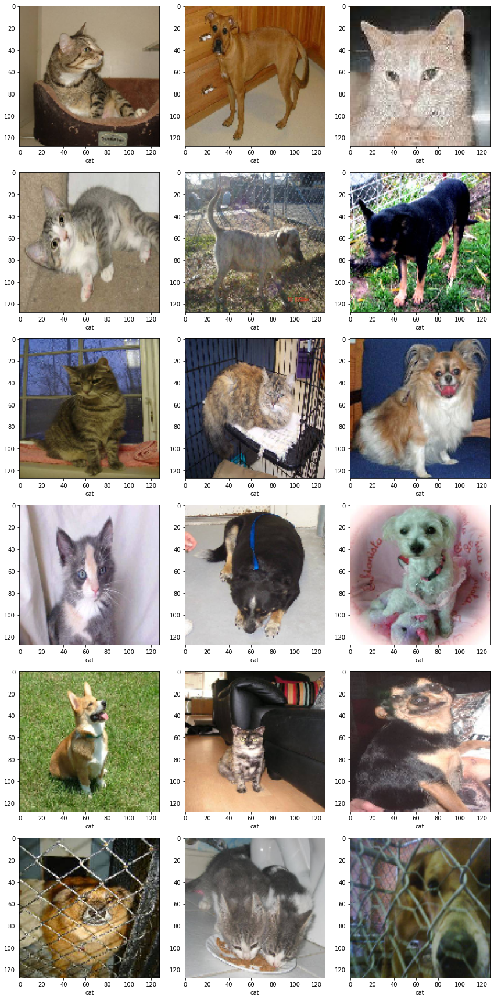

In [ ]:
#plotting the test data and their prdicted label
sample_test = test_df.head(18)
sample_test.head()
plt.figure(figsize=(12, 24))
for index, row in sample_test.iterrows():
    filename = row['filename']
    category = row['category']
    img = load_img("test1/"+filename, target_size=Image_Size)
    plt.subplot(6, 3, index+1)
    plt.imshow(img)
    #plt.xlabel( '(' + "{}".format(category) + ')' )
    plt.xlabel(category)
plt.tight_layout()
plt.show()

14. PART B - ACTIVATION FUNCTION (Changing from RELU to ELU)

In [ ]:
model_new=Sequential()
#Adding convolution layer
model_new.add(Conv2D(32,(3,3),activation='elu',input_shape=(Image_Width,Image_Height,Image_Channels)))
model_new.add(BatchNormalization())
model_new.add(MaxPooling2D(pool_size=(2,2)))
model_new.add(Dropout(0.25))
#Adding convolution layer
model_new.add(Conv2D(64,(3,3),activation='elu'))
model_new.add(BatchNormalization())
model_new.add(MaxPooling2D(pool_size=(2,2)))
model_new.add(Dropout(0.25))
#Adding convolution layer
model_new.add(Conv2D(128,(3,3),activation='elu'))
model_new.add(BatchNormalization())
model_new.add(MaxPooling2D(pool_size=(2,2)))
model_new.add(Dropout(0.25))
#Adding Dense layers
model_new.add(Flatten())
model_new.add(Dense(512,activation='elu'))
model_new.add(BatchNormalization())
model_new.add(Dropout(0.5))
model_new.add(Dense(2,activation='softmax'))
#Compiling the model
model_new.compile(loss='categorical_crossentropy',
  optimizer='rmsprop',metrics=['accuracy'])

In [ ]:
#printing the model summary
model_new.summary()

Model: "sequential_1"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_3 (Conv2D)            (None, 126, 126, 32)      896       
_________________________________________________________________
batch_normalization_4 (Batch (None, 126, 126, 32)      128       
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 63, 63, 32)        0         
_________________________________________________________________
dropout_4 (Dropout)          (None, 63, 63, 32)        0         
_________________________________________________________________
conv2d_4 (Conv2D)            (None, 61, 61, 64)        18496     
_________________________________________________________________
batch_normalization_5 (Batch (None, 61, 61, 64)        256       
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 30, 30, 64)       

In [ ]:
#training the model
epochs=50
history_new = model_new.fit(
    train_generator,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=total_validate//batch_size,
    steps_per_epoch=total_train//batch_size,
    callbacks=callbacks
)

Epoch 1/50
21/21 [==============================] - 78s 4s/step - loss: 1.4747 - accuracy: 0.5505 - val_loss: 2.2181 - val_accuracy: 0.5200
Epoch 2/50
21/21 [==============================] - 37s 2s/step - loss: 0.8301 - accuracy: 0.5901 - val_loss: 1.0628 - val_accuracy: 0.5747
Epoch 3/50
21/21 [==============================] - 36s 2s/step - loss: 0.8029 - accuracy: 0.6063 - val_loss: 1.6275 - val_accuracy: 0.5627
Epoch 4/50
21/21 [==============================] - 37s 2s/step - loss: 0.7594 - accuracy: 0.6198 - val_loss: 2.2319 - val_accuracy: 0.5067
Epoch 5/50
21/21 [==============================] - 37s 2s/step - loss: 0.7061 - accuracy: 0.6372 - val_loss: 0.9730 - val_accuracy: 0.5720
Epoch 6/50
21/21 [==============================] - 37s 2s/step - loss: 0.6649 - accuracy: 0.6662 - val_loss: 2.1410 - val_accuracy: 0.5120
Epoch 7/50
21/21 [==============================] - 37s 2s/step - loss: 0.6655 - accuracy: 0.6708 - val_loss: 1.0133 - val_accuracy: 0.5733
Epoch 8/50
21/21 [==

In [ ]:
#saving the model for future use
model_new.save("model2_catsVSdogs_50epoch.h5")

In [ ]:
#predicting from model on the test data
predict_new = model_new.predict(test_generator, steps=np.ceil(nb_samples/batch_size))

In [ ]:
#finding the class with the largest predicted probability
test_new_df = test_df
test_new_df['category'] = np.argmax(predict_new, axis=-1)
#changing 0 and 1 to cat and dog label names
label_map = dict((v,k) for k,v in train_generator.class_indices.items())
test_new_df['category'] = test_new_df['category'].replace(label_map)

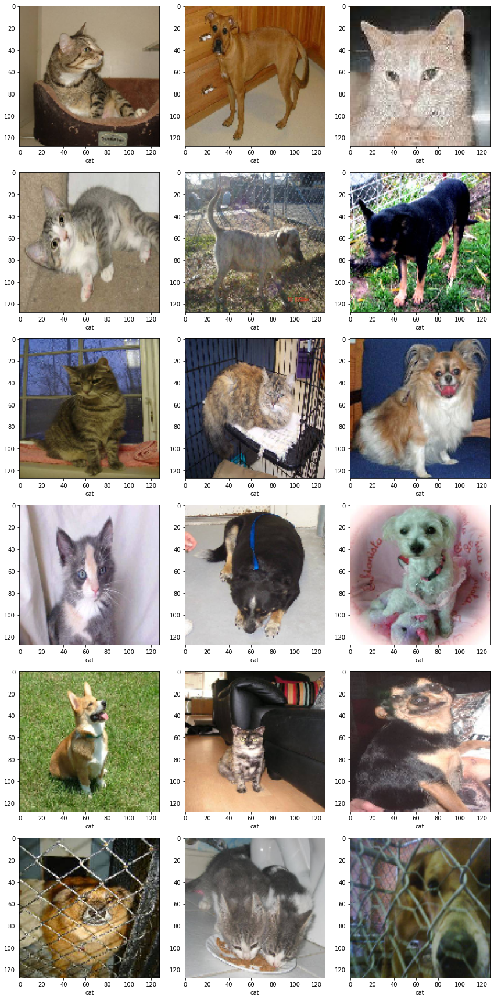

In [ ]:
#plotting the test images with predicted label
sample_test_new = test_new_df.head(18)
sample_test_new.head()
plt.figure(figsize=(12, 24))
for index, row in sample_test_new.iterrows():
    filename = row['filename']
    category = row['category']
    img = load_img("test1/"+filename, target_size=Image_Size)
    plt.subplot(6, 3, index+1)
    plt.imshow(img)
    #plt.xlabel( '(' + "{}".format(category) + ')' )
    plt.xlabel(category)
plt.tight_layout()
plt.show()

15. PART C - COST FUNCTION (Changing from 'categorical_crossentropy to 'binary_crossentropy' )

In [ ]:
model_new1=Sequential()
#Adding convolution layer
model_new1.add(Conv2D(32,(3,3),activation='relu',input_shape=(Image_Width,Image_Height,Image_Channels)))
model_new1.add(BatchNormalization())
model_new1.add(MaxPooling2D(pool_size=(2,2)))
model_new1.add(Dropout(0.25))
#Adding convolution layer
model_new1.add(Conv2D(64,(3,3),activation='relu'))
model_new1.add(BatchNormalization())
model_new1.add(MaxPooling2D(pool_size=(2,2)))
model_new1.add(Dropout(0.25))
#Adding convolution layer
model_new1.add(Conv2D(128,(3,3),activation='relu'))
model_new1.add(BatchNormalization())
model_new1.add(MaxPooling2D(pool_size=(2,2)))
model_new1.add(Dropout(0.25))
#Adding dense layers
model_new1.add(Flatten())
model_new1.add(Dense(512,activation='relu'))
model_new1.add(BatchNormalization())
model_new1.add(Dropout(0.5))
model_new1.add(Dense(2,activation='softmax'))
#compiling the model
model_new1.compile(loss='binary_crossentropy',
  optimizer='rmsprop',metrics=['accuracy'])

In [ ]:
#printing the model sumary
model_new1.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_6 (Conv2D)            (None, 126, 126, 32)      896       
_________________________________________________________________
batch_normalization_8 (Batch (None, 126, 126, 32)      128       
_________________________________________________________________
max_pooling2d_6 (MaxPooling2 (None, 63, 63, 32)        0         
_________________________________________________________________
dropout_8 (Dropout)          (None, 63, 63, 32)        0         
_________________________________________________________________
conv2d_7 (Conv2D)            (None, 61, 61, 64)        18496     
_________________________________________________________________
batch_normalization_9 (Batch (None, 61, 61, 64)        256       
_________________________________________________________________
max_pooling2d_7 (MaxPooling2 (None, 30, 30, 64)       

In [ ]:
#training the model
epochs=50
history_new1 = model_new1.fit(
    train_generator,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=total_validate//batch_size,
    steps_per_epoch=total_train//batch_size,
    callbacks=callbacks
)

Epoch 1/50
21/21 [==============================] - 55s 3s/step - loss: 1.0329 - accuracy: 0.5882 - val_loss: 1.1103 - val_accuracy: 0.5040
Epoch 2/50
21/21 [==============================] - 34s 2s/step - loss: 0.7840 - accuracy: 0.6314 - val_loss: 2.4360 - val_accuracy: 0.5053
Epoch 3/50
21/21 [==============================] - 35s 2s/step - loss: 0.7158 - accuracy: 0.6459 - val_loss: 2.0650 - val_accuracy: 0.5027
Epoch 4/50
21/21 [==============================] - 34s 2s/step - loss: 0.7181 - accuracy: 0.6669 - val_loss: 2.2647 - val_accuracy: 0.4880
Epoch 5/50
21/21 [==============================] - 35s 2s/step - loss: 0.6792 - accuracy: 0.6746 - val_loss: 1.1311 - val_accuracy: 0.5093
Epoch 6/50
21/21 [==============================] - 35s 2s/step - loss: 0.6398 - accuracy: 0.7001 - val_loss: 4.0483 - val_accuracy: 0.5107
Epoch 7/50
21/21 [==============================] - 35s 2s/step - loss: 0.6062 - accuracy: 0.7078 - val_loss: 2.8601 - val_accuracy: 0.4987
Epoch 8/50
21/21 [==

In [ ]:
#saving the model for future useage
model_new1.save("model3_catsVSdogs_50epoch.h5")

In [ ]:
predict_new1 = model_new1.predict(test_generator, steps=np.ceil(nb_samples/batch_size))

In [ ]:
#finding the class with the largest predicted probability
test_new1_df = test_df
test_new1_df['category'] = np.argmax(predict_new1, axis=-1)
#converting 0's and 1's to cat and dog label names
label_map = dict((v,k) for k,v in train_generator.class_indices.items())
test_new1_df['category'] = test_new1_df['category'].replace(label_map)

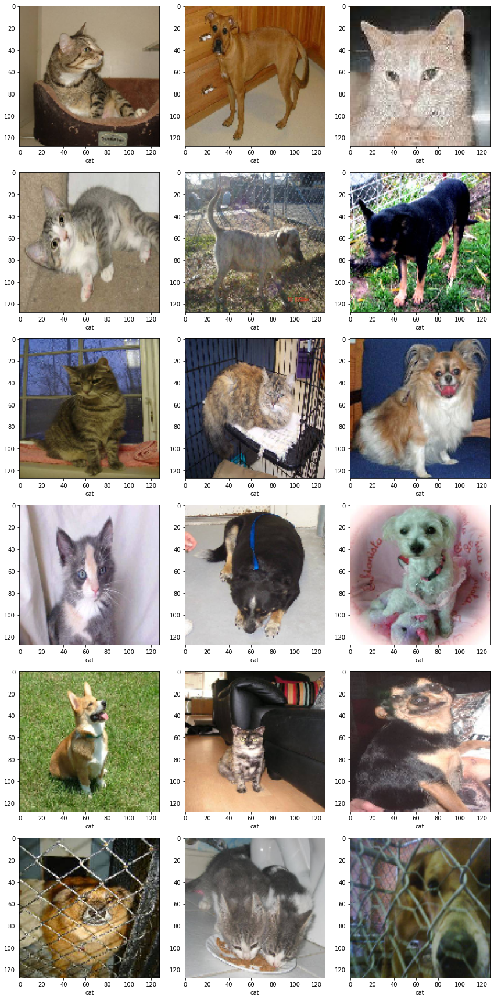

In [ ]:
#plotting the test images with predicted labels
sample_test_new1 = test_new1_df.head(18)
sample_test_new1.head()
plt.figure(figsize=(12, 24))
for index, row in sample_test_new1.iterrows():
    filename = row['filename']
    category = row['category']
    img = load_img("test1/"+filename, target_size=Image_Size)
    plt.subplot(6, 3, index+1)
    plt.imshow(img)
    #plt.xlabel( '(' + "{}".format(category) + ')' )
    plt.xlabel(category)
plt.tight_layout()
plt.show()

16. PART D - EPOCHS (Increasing Epochs from 50 to 70)

In [ ]:
model_new2=Sequential()
#Adding convolution layer
model_new2.add(Conv2D(32,(3,3),activation='relu',input_shape=(Image_Width,Image_Height,Image_Channels)))
model_new2.add(BatchNormalization())
model_new2.add(MaxPooling2D(pool_size=(2,2)))
model_new2.add(Dropout(0.25))
#Adding convolution layer
model_new2.add(Conv2D(64,(3,3),activation='relu'))
model_new2.add(BatchNormalization())
model_new2.add(MaxPooling2D(pool_size=(2,2)))
model_new2.add(Dropout(0.25))
#Adding convolution layer
model_new2.add(Conv2D(128,(3,3),activation='relu'))
model_new2.add(BatchNormalization())
model_new2.add(MaxPooling2D(pool_size=(2,2)))
model_new2.add(Dropout(0.25))
#Adding dense layers
model_new2.add(Flatten())
model_new2.add(Dense(512,activation='relu'))
model_new2.add(BatchNormalization())
model_new2.add(Dropout(0.5))
model_new2.add(Dense(2,activation='softmax'))
#compiling the model
model_new2.compile(loss='categorical_crossentropy',
  optimizer='rmsprop',metrics=['accuracy'])

In [ ]:
#printing the model summary
model_new2.summary()

Model: "sequential_3"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_9 (Conv2D)            (None, 126, 126, 32)      896       
_________________________________________________________________
batch_normalization_12 (Batc (None, 126, 126, 32)      128       
_________________________________________________________________
max_pooling2d_9 (MaxPooling2 (None, 63, 63, 32)        0         
_________________________________________________________________
dropout_12 (Dropout)         (None, 63, 63, 32)        0         
_________________________________________________________________
conv2d_10 (Conv2D)           (None, 61, 61, 64)        18496     
_________________________________________________________________
batch_normalization_13 (Batc (None, 61, 61, 64)        256       
_________________________________________________________________
max_pooling2d_10 (MaxPooling (None, 30, 30, 64)       

In [ ]:
#training the model with callbacks
epochs=70
history_new2 = model_new2.fit(
    train_generator,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=total_validate//batch_size,
    steps_per_epoch=total_train//batch_size,
    callbacks=callbacks
)

Epoch 1/70
21/21 [==============================] - 42s 2s/step - loss: 1.2220 - accuracy: 0.5811 - val_loss: 1.1644 - val_accuracy: 0.5133
Epoch 2/70
21/21 [==============================] - 35s 2s/step - loss: 0.8578 - accuracy: 0.6127 - val_loss: 1.0533 - val_accuracy: 0.5013
Epoch 3/70
21/21 [==============================] - 35s 2s/step - loss: 0.7982 - accuracy: 0.6279 - val_loss: 2.3272 - val_accuracy: 0.5040
Epoch 4/70
21/21 [==============================] - 35s 2s/step - loss: 0.7505 - accuracy: 0.6530 - val_loss: 0.9159 - val_accuracy: 0.5027
Epoch 5/70
21/21 [==============================] - 34s 2s/step - loss: 0.6760 - accuracy: 0.6714 - val_loss: 0.6949 - val_accuracy: 0.6120
Epoch 6/70
21/21 [==============================] - 35s 2s/step - loss: 0.7193 - accuracy: 0.6433 - val_loss: 0.7432 - val_accuracy: 0.5787
Epoch 7/70
21/21 [==============================] - 36s 2s/step - loss: 0.6655 - accuracy: 0.6838 - val_loss: 0.8865 - val_accuracy: 0.5187
Epoch 8/70
21/21 [==

In [ ]:
#saving the model for future usage
model_new2.save("model4_catsVSdogs_70epoch.h5")

In [ ]:
#making prediction of test images
predict_new2 = model_new2.predict(test_generator, steps=np.ceil(nb_samples/batch_size))

In [ ]:
#finding the class with the largest predicted probability
test_new2_df = test_df
test_new2_df['category'] = np.argmax(predict_new2, axis=-1)
#converting 0's and 1's with cat and dog label names
label_map = dict((v,k) for k,v in train_generator.class_indices.items())
test_new2_df['category'] = test_new2_df['category'].replace(label_map)

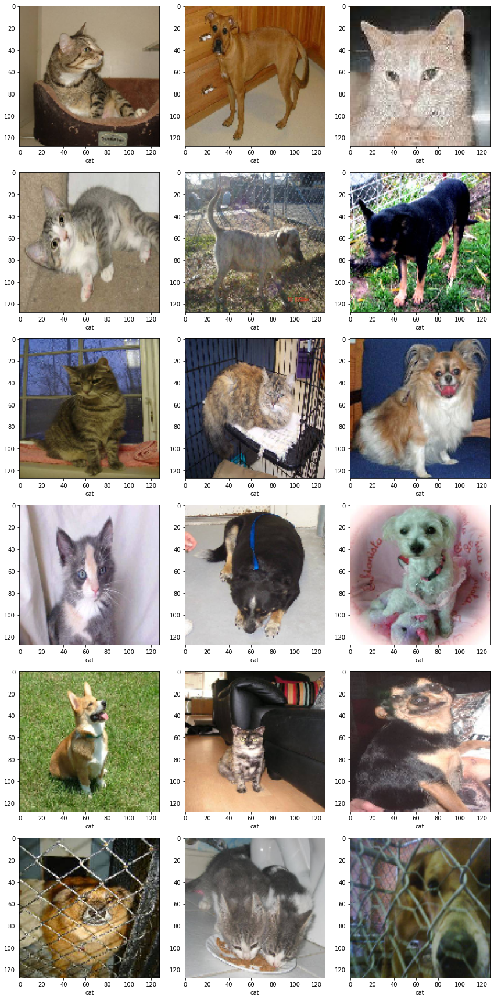

In [ ]:
#plotting the test image with predicted labels
sample_test_new2 = test_new2_df.head(18)
sample_test_new2.head()
plt.figure(figsize=(12, 24))
for index, row in sample_test_new2.iterrows():
    filename = row['filename']
    category = row['category']
    img = load_img("test1/"+filename, target_size=Image_Size)
    plt.subplot(6, 3, index+1)
    plt.imshow(img)
    #plt.xlabel( '(' + "{}".format(category) + ')' )
    plt.xlabel(category)
plt.tight_layout()
plt.show()

17. PART G - NETWORK INITIALIZATION (Changing from default initialization to Truncated normal initialization)

In [ ]:
#defining the initializer for dense layer (default is Xavier uniform for CNN,Dense and RNN layers)
initializer = tf.keras.initializers.TruncatedNormal(mean=0., stddev=1.)

In [ ]:
model_new3=Sequential()
#Adding convolution layer
model_new3.add(Conv2D(32,(3,3),activation='relu',input_shape=(Image_Width,Image_Height,Image_Channels)))
model_new3.add(BatchNormalization())
model_new3.add(MaxPooling2D(pool_size=(2,2)))
model_new3.add(Dropout(0.25))
#Adding convolution layer
model_new3.add(Conv2D(64,(3,3),activation='relu'))
model_new3.add(BatchNormalization())
model_new3.add(MaxPooling2D(pool_size=(2,2)))
model_new3.add(Dropout(0.25))
#Adding convolution layer
model_new3.add(Conv2D(128,(3,3),activation='relu'))
model_new3.add(BatchNormalization())
model_new3.add(MaxPooling2D(pool_size=(2,2)))
model_new3.add(Dropout(0.25))
#Adding dense layers (last layer is intialized with truncated normal)
model_new3.add(Flatten())
model_new3.add(Dense(512,activation='relu'))
model_new3.add(BatchNormalization())
model_new3.add(Dropout(0.5))
model_new3.add(Dense(2,activation='softmax',kernel_initializer=initializer))
#compile the model
model_new3.compile(loss='categorical_crossentropy',
  optimizer='rmsprop',metrics=['accuracy'])


In [ ]:
#printing the summary
model_new3.summary()

Model: "sequential_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_12 (Conv2D)           (None, 126, 126, 32)      896       
_________________________________________________________________
batch_normalization_16 (Batc (None, 126, 126, 32)      128       
_________________________________________________________________
max_pooling2d_12 (MaxPooling (None, 63, 63, 32)        0         
_________________________________________________________________
dropout_16 (Dropout)         (None, 63, 63, 32)        0         
_________________________________________________________________
conv2d_13 (Conv2D)           (None, 61, 61, 64)        18496     
_________________________________________________________________
batch_normalization_17 (Batc (None, 61, 61, 64)        256       
_________________________________________________________________
max_pooling2d_13 (MaxPooling (None, 30, 30, 64)       

In [ ]:
#training the model with callbacks
epochs=50
history_new3 = model_new3.fit(
    train_generator,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=total_validate//batch_size,
    steps_per_epoch=total_train//batch_size,
    callbacks=callbacks
)

Epoch 1/50
21/21 [==============================] - 53s 2s/step - loss: 18.0077 - accuracy: 0.5659 - val_loss: 20.6303 - val_accuracy: 0.5027
Epoch 2/50
21/21 [==============================] - 35s 2s/step - loss: 10.3946 - accuracy: 0.5776 - val_loss: 34.1817 - val_accuracy: 0.5067
Epoch 3/50
21/21 [==============================] - 35s 2s/step - loss: 8.2347 - accuracy: 0.5837 - val_loss: 80.5806 - val_accuracy: 0.5080
Epoch 4/50
21/21 [==============================] - 35s 2s/step - loss: 8.0278 - accuracy: 0.6011 - val_loss: 2.8071 - val_accuracy: 0.5733
Epoch 5/50
21/21 [==============================] - 35s 2s/step - loss: 7.4602 - accuracy: 0.6098 - val_loss: 21.9834 - val_accuracy: 0.4933
Epoch 6/50
21/21 [==============================] - 35s 2s/step - loss: 5.6970 - accuracy: 0.6195 - val_loss: 19.0204 - val_accuracy: 0.4827
Epoch 7/50
21/21 [==============================] - 35s 2s/step - loss: 4.5913 - accuracy: 0.6172 - val_loss: 9.1856 - val_accuracy: 0.5187
Epoch 8/50
21

In [ ]:
#save the model for future usages
model_new3.save("model5_catsVSdogs_50epoch.h5")

In [ ]:
#making prediction from the model on the test images
predict_new3 = model_new3.predict(test_generator, steps=np.ceil(nb_samples/batch_size))

In [ ]:
#finding the class with the largest predicted probability
test_new3_df = test_df
test_new3_df['category'] = np.argmax(predict_new3, axis=-1)
#changing 0's and 1's to cat and dogs label names
label_map = dict((v,k) for k,v in train_generator.class_indices.items())
test_new3_df['category'] = test_new3_df['category'].replace(label_map)

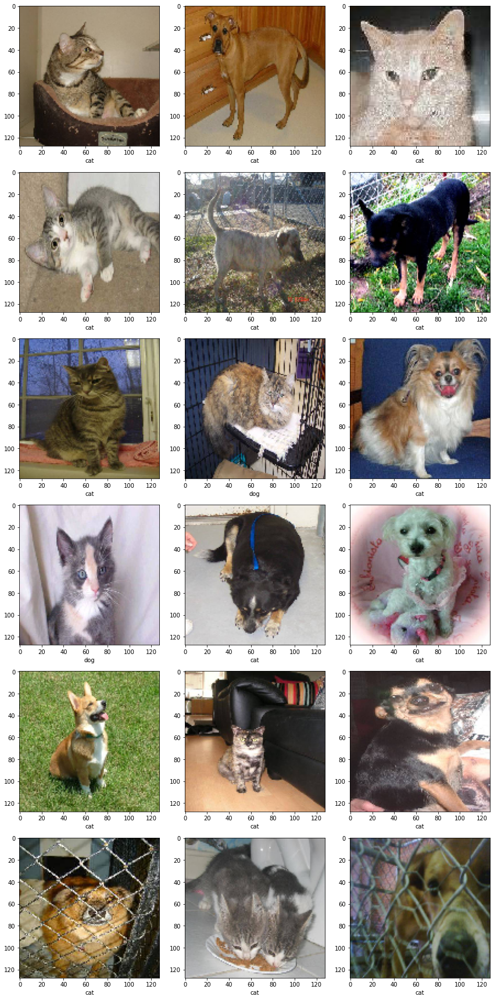

In [ ]:
#plotting the test images with predicted labels
sample_test_new3 = test_new3_df.head(18)
sample_test_new3.head()
plt.figure(figsize=(12, 24))
for index, row in sample_test_new3.iterrows():
    filename = row['filename']
    category = row['category']
    img = load_img("test1/"+filename, target_size=Image_Size)
    plt.subplot(6, 3, index+1)
    plt.imshow(img)
    #plt.xlabel( '(' + "{}".format(category) + ')' )
    plt.xlabel(category)
plt.tight_layout()
plt.show()

18. PART E - GRADIENT ESTIMATION (Changing from RMSProp to ADAM)

In [ ]:
model_new4=Sequential()
#Adding convolution layer
model_new4.add(Conv2D(32,(3,3),activation='relu',input_shape=(Image_Width,Image_Height,Image_Channels)))
model_new4.add(BatchNormalization())
model_new4.add(MaxPooling2D(pool_size=(2,2)))
model_new4.add(Dropout(0.25))
#Adding convolution layer
model_new4.add(Conv2D(64,(3,3),activation='relu'))
model_new4.add(BatchNormalization())
model_new4.add(MaxPooling2D(pool_size=(2,2)))
model_new4.add(Dropout(0.25))
#Adding convolution layer
model_new4.add(Conv2D(128,(3,3),activation='relu'))
model_new4.add(BatchNormalization())
model_new4.add(MaxPooling2D(pool_size=(2,2)))
model_new4.add(Dropout(0.25))
#Adding dense layers
model_new4.add(Flatten())
model_new4.add(Dense(512,activation='relu'))
model_new4.add(BatchNormalization())
model_new4.add(Dropout(0.5))
model_new4.add(Dense(2,activation='softmax'))
#compiling the model
model_new4.compile(loss='categorical_crossentropy',
  optimizer='adam',metrics=['accuracy'])


In [ ]:
#printing the model summary
model_new4.summary()

Model: "sequential_5"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_15 (Conv2D)           (None, 126, 126, 32)      896       
_________________________________________________________________
batch_normalization_20 (Batc (None, 126, 126, 32)      128       
_________________________________________________________________
max_pooling2d_15 (MaxPooling (None, 63, 63, 32)        0         
_________________________________________________________________
dropout_20 (Dropout)         (None, 63, 63, 32)        0         
_________________________________________________________________
conv2d_16 (Conv2D)           (None, 61, 61, 64)        18496     
_________________________________________________________________
batch_normalization_21 (Batc (None, 61, 61, 64)        256       
_________________________________________________________________
max_pooling2d_16 (MaxPooling (None, 30, 30, 64)       

In [ ]:
#traing the model with callbacks
epochs=50
history_new4 = model_new4.fit(
    train_generator,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=total_validate//batch_size,
    steps_per_epoch=total_train//batch_size,
    callbacks=callbacks
)

Epoch 1/50
21/21 [==============================] - 62s 3s/step - loss: 1.2350 - accuracy: 0.5830 - val_loss: 3.1945 - val_accuracy: 0.5000
Epoch 2/50
21/21 [==============================] - 33s 2s/step - loss: 0.7507 - accuracy: 0.6350 - val_loss: 6.7714 - val_accuracy: 0.5120
Epoch 3/50
21/21 [==============================] - 34s 2s/step - loss: 0.7233 - accuracy: 0.6550 - val_loss: 7.7436 - val_accuracy: 0.5147
Epoch 4/50
21/21 [==============================] - 33s 2s/step - loss: 0.6852 - accuracy: 0.6591 - val_loss: 6.3020 - val_accuracy: 0.5080
Epoch 5/50
21/21 [==============================] - 34s 2s/step - loss: 0.6510 - accuracy: 0.6749 - val_loss: 5.8971 - val_accuracy: 0.5173
Epoch 6/50
21/21 [==============================] - 35s 2s/step - loss: 0.6041 - accuracy: 0.7007 - val_loss: 3.3794 - val_accuracy: 0.5160
Epoch 7/50
21/21 [==============================] - 34s 2s/step - loss: 0.5948 - accuracy: 0.6995 - val_loss: 2.4271 - val_accuracy: 0.5027
Epoch 8/50
21/21 [==

In [ ]:
#saving the model for future usages
model_new4.save("model6_catsVSdogs_50epoch.h5")

In [ ]:
#making predictions from the model on test data
predict_new4 = model_new4.predict(test_generator, steps=np.ceil(nb_samples/batch_size))

In [ ]:
#finding the class with the largest predicted probability
test_new4_df = test_df
test_new4_df['category'] = np.argmax(predict_new4, axis=-1)
#changing 0's and 1's to cat and dog label names
label_map = dict((v,k) for k,v in train_generator.class_indices.items())
test_new4_df['category'] = test_new4_df['category'].replace(label_map)

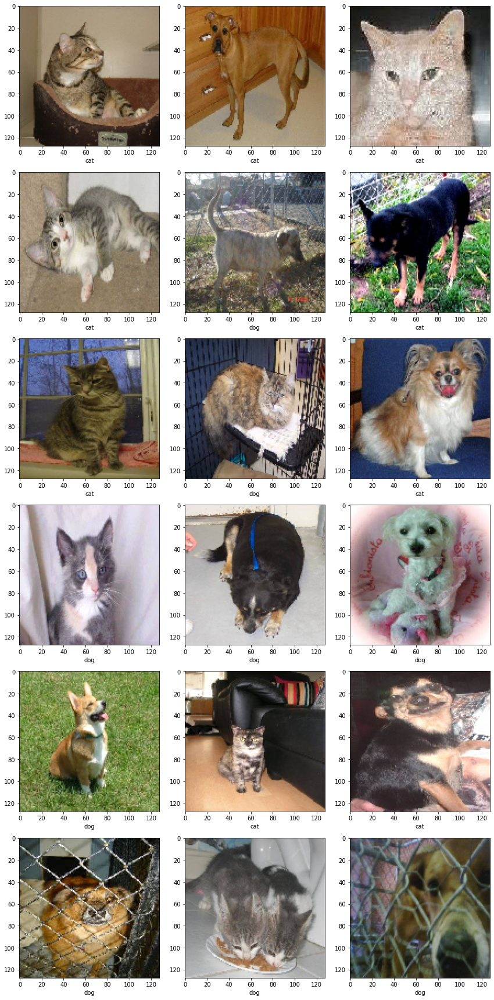

In [ ]:
#plotting the test image with predicted labels
sample_test_new4 = test_new4_df.head(18)
sample_test_new4.head()
plt.figure(figsize=(12, 24))
for index, row in sample_test_new4.iterrows():
    filename = row['filename']
    category = row['category']
    img = load_img("test1/"+filename, target_size=Image_Size)
    plt.subplot(6, 3, index+1)
    plt.imshow(img)
    #plt.xlabel( '(' + "{}".format(category) + ')' )
    plt.xlabel(category)
plt.tight_layout()
plt.show()

19. PART F - NETWORK ARCHITECTURE (Changing from 3Convolution2Dense layer to 2Convolution2Dense layer)

In [ ]:
model_new5=Sequential()
#Adding convolution layer
model_new5.add(Conv2D(32,(3,3),activation='relu',input_shape=(Image_Width,Image_Height,Image_Channels)))
model_new5.add(BatchNormalization())
model_new5.add(MaxPooling2D(pool_size=(2,2)))
model_new5.add(Dropout(0.25))
#Adding Convolutionlayer
model_new5.add(Conv2D(64,(3,3),activation='relu'))
model_new5.add(BatchNormalization())
model_new5.add(MaxPooling2D(pool_size=(2,2)))
model_new5.add(Dropout(0.25))
#Adding dense layers
model_new5.add(Flatten())
model_new5.add(Dense(256,activation='relu'))
model_new5.add(BatchNormalization())
model_new5.add(Dropout(0.5))
model_new5.add(Dense(2,activation='softmax'))
#compiling the model
model_new5.compile(loss='categorical_crossentropy',
  optimizer='rmsprop',metrics=['accuracy'])

In [ ]:
#printing the model summary
model_new5.summary()

Model: "sequential_6"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_18 (Conv2D)           (None, 126, 126, 32)      896       
_________________________________________________________________
batch_normalization_24 (Batc (None, 126, 126, 32)      128       
_________________________________________________________________
max_pooling2d_18 (MaxPooling (None, 63, 63, 32)        0         
_________________________________________________________________
dropout_24 (Dropout)         (None, 63, 63, 32)        0         
_________________________________________________________________
conv2d_19 (Conv2D)           (None, 61, 61, 64)        18496     
_________________________________________________________________
batch_normalization_25 (Batc (None, 61, 61, 64)        256       
_________________________________________________________________
max_pooling2d_19 (MaxPooling (None, 30, 30, 64)       

In [ ]:
#training the model with callbacks
epochs=50
history_new5 = model_new5.fit(
    train_generator,
    epochs=epochs,
    validation_data=validation_generator,
    validation_steps=total_validate//batch_size,
    steps_per_epoch=total_train//batch_size,
    callbacks=callbacks
)

Epoch 1/50
21/21 [==============================] - 101s 5s/step - loss: 0.5596 - accuracy: 0.7035 - val_loss: 1.5401 - val_accuracy: 0.5213
Epoch 2/50
21/21 [==============================] - 31s 1s/step - loss: 0.5443 - accuracy: 0.7169 - val_loss: 0.6488 - val_accuracy: 0.6693
Epoch 3/50
21/21 [==============================] - 32s 1s/step - loss: 0.5352 - accuracy: 0.7346 - val_loss: 8.6706 - val_accuracy: 0.4947
Epoch 4/50
21/21 [==============================] - 32s 1s/step - loss: 0.5415 - accuracy: 0.7333 - val_loss: 5.4751 - val_accuracy: 0.4987
Epoch 5/50
21/21 [==============================] - 31s 1s/step - loss: 0.5232 - accuracy: 0.7472 - val_loss: 9.7813 - val_accuracy: 0.4907
Epoch 6/50
21/21 [==============================] - 31s 1s/step - loss: 0.5109 - accuracy: 0.7465 - val_loss: 9.3511 - val_accuracy: 0.4893
Epoch 7/50
21/21 [==============================] - 31s 1s/step - loss: 0.4929 - accuracy: 0.7552 - val_loss: 12.1554 - val_accuracy: 0.4907
Epoch 8/50
21/21 [

In [ ]:
#saving the model for future usages
model_new5.save("model7_catsVSdogs_50epoch.h5")

In [ ]:
#making predictions from model on saved data
predict_new5 = model_new5.predict(test_generator, steps=np.ceil(nb_samples/batch_size))

In [ ]:
#finding the class with the largest predicted probability
test_new5_df = test_df
test_new5_df['category'] = np.argmax(predict_new5, axis=-1)
#changing 0's and 1's to cat and dog label names
label_map = dict((v,k) for k,v in train_generator.class_indices.items())
test_new5_df['category'] = test_new5_df['category'].replace(label_map)

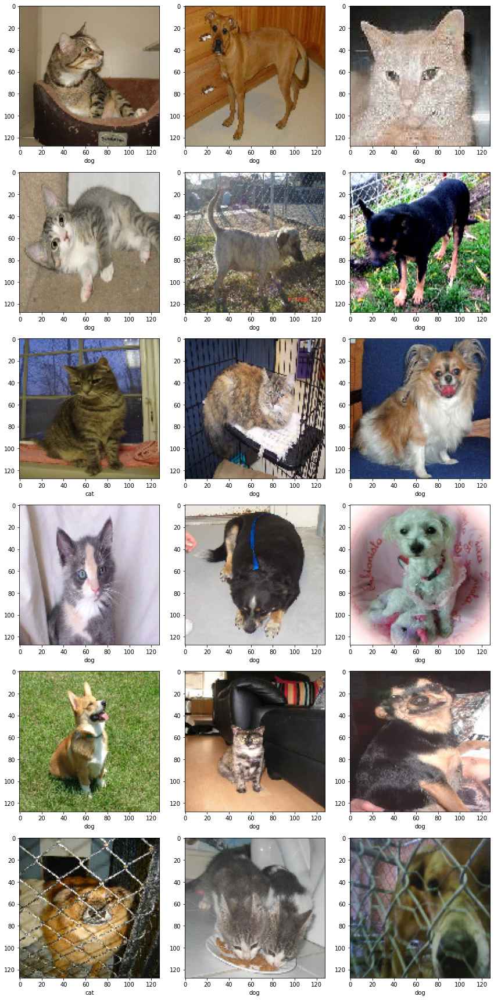

In [ ]:
#plotting the test image with predicted labels
sample_test_new5 = test_new5_df.head(18)
sample_test_new5.head()
plt.figure(figsize=(12, 24))
for index, row in sample_test_new5.iterrows():
    filename = row['filename']
    category = row['category']
    img = load_img("test1/"+filename, target_size=Image_Size)
    plt.subplot(6, 3, index+1)
    plt.imshow(img)
    #plt.xlabel( '(' + "{}".format(category) + ')' )
    plt.xlabel(category)
plt.tight_layout()
plt.show()

#Conclusion:
After running all the  changes we found that there are minor chages if we change parameters from B-G except D which contributed to a better accuracy as compared to another. These results can be viewed clearly on Tensorboard.

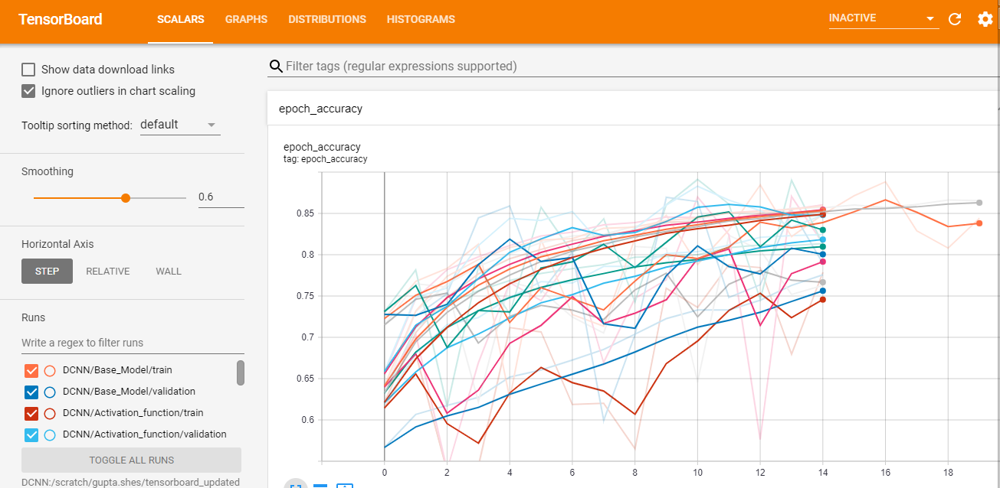

#References/Citations:
1. https://keras.io/
2. https://data-flair.training/blogs/cats-dogs-classification-deep-learning-project-beginners/
3. https://deeplizard.com/
4. https://towardsdatascience.com/boosting-your-neural-networks-with-tensorboard-bc6ce815d55b
5. https://www.tensorflow.org/tensorboard/get_started